### Importing libraries

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import os
os.chdir(r'D:\Project_1')
import warnings
warnings.filterwarnings('ignore')

### Reading Train/Test data

In [2]:
train = pd.read_csv("Train.csv")
test = pd.read_csv("Test.csv")

In [3]:
train.head(2)

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N


In [4]:
test.head(2)

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,LP001015,Male,Yes,0,Graduate,No,5720,0,110.0,360.0,1.0,Urban
1,LP001022,Male,Yes,1,Graduate,No,3076,1500,126.0,360.0,1.0,Urban


### Number of data_points 

In [5]:
print('Train_data_points : ',train.shape)
print('Test_data_points : ',test.shape)

Train_data_points :  (614, 13)
Test_data_points :  (367, 12)


### Columns in data_set

In [6]:
train.columns

Index(['Loan_ID', 'Gender', 'Married', 'Dependents', 'Education',
       'Self_Employed', 'ApplicantIncome', 'CoapplicantIncome', 'LoanAmount',
       'Loan_Amount_Term', 'Credit_History', 'Property_Area', 'Loan_Status'],
      dtype='object')

In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            614 non-null    object 
 1   Gender             601 non-null    object 
 2   Married            611 non-null    object 
 3   Dependents         599 non-null    object 
 4   Education          614 non-null    object 
 5   Self_Employed      582 non-null    object 
 6   ApplicantIncome    614 non-null    int64  
 7   CoapplicantIncome  614 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   600 non-null    float64
 10  Credit_History     564 non-null    float64
 11  Property_Area      614 non-null    object 
 12  Loan_Status        614 non-null    object 
dtypes: float64(4), int64(1), object(8)
memory usage: 62.5+ KB


In [8]:
train.describe()

,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History
count,614.000000,614.000000,592.000000,600.00000,564.000000
mean,5403.459283,1621.245798,146.412162,342.00000,0.842199
std,6109.041673,2926.248369,85.587325,65.12041,0.364878
min,150.000000,0.000000,9.000000,12.00000,0.000000
25%,2877.500000,0.000000,100.000000,360.00000,1.000000
50%,3812.500000,1188.500000,128.000000,360.00000,1.000000
75%,5795.000000,2297.250000,168.000000,360.00000,1.000000
max,81000.000000,41667.000000,700.000000,480.00000,1.000000


### Preprocessing

In [9]:
#concatinating train and test data
total_data = pd.concat([train,test])

In [10]:
#dropind 'Loan_ID' column
total_data.drop('Loan_ID',axis=1,inplace=True)

In [11]:
total_data.shape

(981, 12)

In [12]:
total_data.head(2)

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N


In [13]:
#identifing missing values
total_data.isnull().sum()

Gender                24
Married                3
Dependents            25
Education              0
Self_Employed         55
ApplicantIncome        0
CoapplicantIncome      0
LoanAmount            27
Loan_Amount_Term      20
Credit_History        79
Property_Area          0
Loan_Status          367
dtype: int64

In [14]:
#imputing missing values
#for all the categorical features missing values are imputed with mode value.

for data in [total_data]:
    data['Gender']=data['Gender'].fillna(data.Gender.dropna().mode()[0])
    data['Married']=data['Married'].fillna(data.Married.dropna().mode()[0])
    data['Dependents']=data['Dependents'].fillna(data.Dependents.dropna().mode()[0])
    data['Self_Employed']=data['Self_Employed'].fillna(data.Self_Employed.dropna().mode()[0])        
    data['Credit_History']=data['Credit_History'].fillna(data.Credit_History.dropna().mode()[0])            

In [15]:
#missing values in numerical features are imputed using 'Iterative_imputer'

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
data0 = total_data.loc[:,['LoanAmount','Loan_Amount_Term']]

In [16]:
impute = IterativeImputer(RandomForestRegressor(),max_iter=12,random_state=0)
data0 = pd.DataFrame(impute.fit_transform(data0),columns=data0.columns)

In [17]:
data0.head(2)

,LoanAmount,Loan_Amount_Term
0,144.208031,360.0
1,128.000000,360.0


In [18]:
total_data['LoanAmount']=data0['LoanAmount']
total_data['Loan_Amount_Term']=data0['Loan_Amount_Term']

In [19]:
#Mapping categorical variables to integers
#imputing missing values
#for all the categorical features missing values are imputed with mode value.

for ft in [total_data]:
    ft['Gender']=ft['Gender'].map({"Male":0,"Female":1}).astype(int)
    ft['Married']=ft['Married'].map({"Yes":1,"No":0}).astype(int)
    ft['Self_Employed']=ft['Self_Employed'].map({"Yes":1,"No":0}).astype(int)
    ft['Education']=ft['Education'].map({"Not Graduate":0,"Graduate":1}).astype(int)           
    ft['Credit_History']=ft['Credit_History'].astype(int) 
    ft['Property_Area']=ft['Property_Area'].map({'Urban':0,'Rural':1,'Semiurban':2})
    ft['Dependents']=ft['Dependents'].map({'0':0,'1':1,'2':2,'3+':3})

In [20]:
total_data.isnull().sum()

Gender                 0
Married                0
Dependents             0
Education              0
Self_Employed          0
ApplicantIncome        0
CoapplicantIncome      0
LoanAmount             0
Loan_Amount_Term       0
Credit_History         0
Property_Area          0
Loan_Status          367
dtype: int64

## Remark

Now we have cleaned data set (except label column) with 0 Nan values.

## Exploratory Data Analysis (EDA)

In [21]:
# splitting back data set into train and test

n_tr = total_data.iloc[:614]
n_te = total_data.iloc[614:]

In [22]:
n_tr.shape

(614, 12)

In [23]:
# converting Y_label from categorical to numerical

n_tr['Loan_Status'] = n_tr['Loan_Status'].map({'Y':1,'N':0})

In [24]:
n_tr.head(2)

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,0,0,0,1,0,5849,0.0,144.208031,360.0,1,0,1
1,0,1,1,1,0,4583,1508.0,128.000000,360.0,1,1,0


## Univariate Analysis

<AxesSubplot:xlabel='Loan_Status', ylabel='count'>

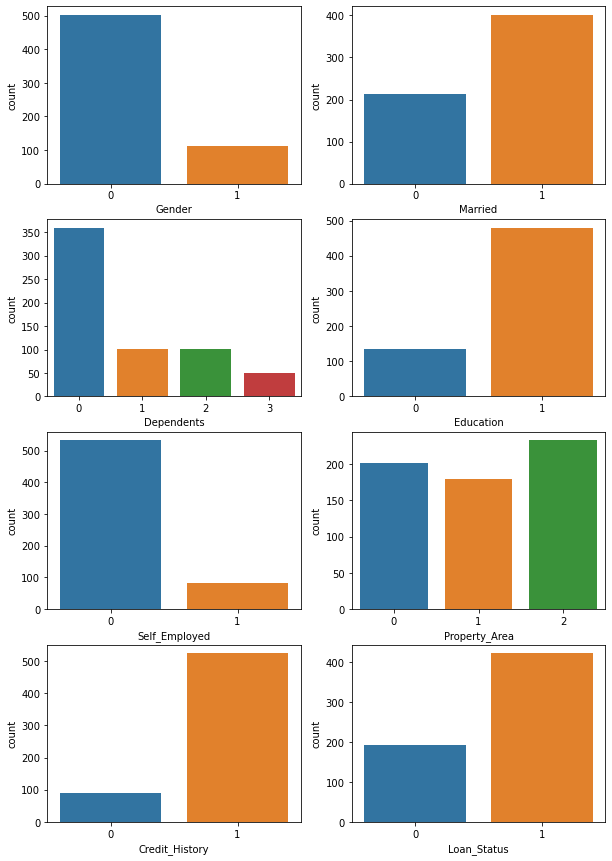

In [25]:
import seaborn as sns
fig,ax = plt.subplots(4,2,figsize=(10,15))
sns.countplot('Gender',data=n_tr,ax=ax[0][0])
sns.countplot('Married',data=n_tr,ax=ax[0][1])
sns.countplot('Dependents',data=n_tr,ax=ax[1][0])
sns.countplot('Education',data=n_tr,ax=ax[1][1])
sns.countplot('Self_Employed',data=n_tr,ax=ax[2][0])
sns.countplot('Property_Area',data=n_tr,ax=ax[2][1])
sns.countplot('Credit_History',data=n_tr,ax=ax[3][0])
sns.countplot('Loan_Status',data=n_tr,ax=ax[3][1])


## Observation 

1. "GENDER" : Number of male applicants are truly higher than female applicants.
2. "MERITAL_STATUS" : Married applicants are higher in number than un_married that indicates need of loan is higher for married ones.
3. "DEPENDENTS" : Count of applicants with no dependents is higher than those who have few dependents.
4. "EDUCATION" : Grduate applicants are higher than non_graduates.
5. "SELF_EMPLOYED" : Count of self employed applicants are a lot higher than non self employed
6. "PROPERTY_AREA" : Count of applicants is quite similer in urban,rural and semi_urban.
7. "CREDIT_HISTORY" : Maximum applicants have registered credit_history.
8. "LOAN_STATUS" : Number of loan approved is almost double of rejected.

## Bi-variate analysis

#### Pair Plot

In [26]:
n_tr.head(2)

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,0,0,0,1,0,5849,0.0,144.208031,360.0,1,0,1
1,0,1,1,1,0,4583,1508.0,128.000000,360.0,1,1,0


In [27]:
a = pd.DataFrame(n_tr[['ApplicantIncome',
                       'CoapplicantIncome','LoanAmount','Loan_Amount_Term','Loan_Status']])
a.head(2)

,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Loan_Status
0,5849,0.0,144.208031,360.0,1
1,4583,1508.0,128.000000,360.0,0


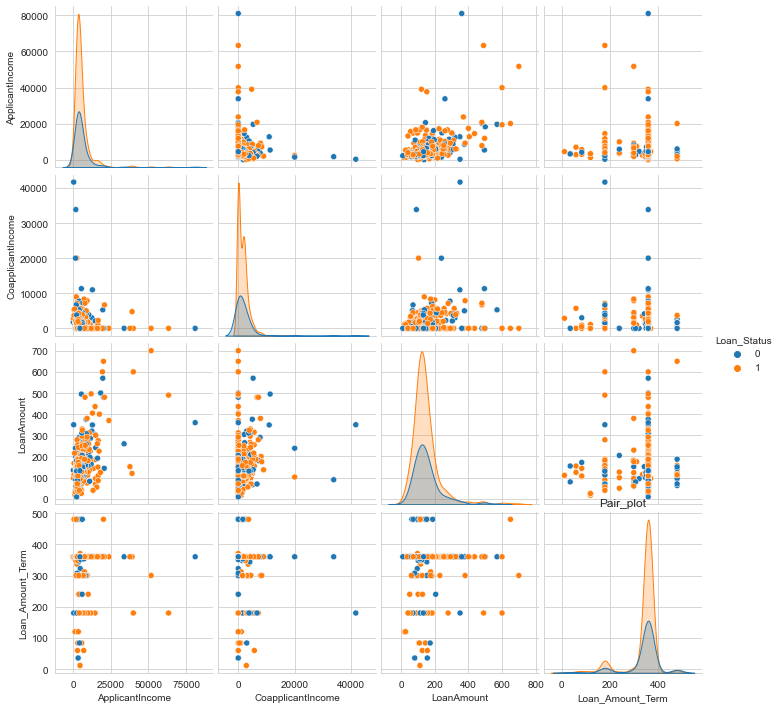

In [28]:
sns.set_style('whitegrid')
data = pd.DataFrame(n_tr['Loan_Status'],n_tr['ApplicantIncome'])
sns.pairplot(a,hue='Loan_Status')
plt.title('Pair_plot')
plt.show()

## Observation (Pair Plot)

1. Deriving conclusion from pair plot is quite difficult as poits are highly overlapped.
2. Loan_amount and loan_amount_term can be useful features for predicting Loan_Status. 

#### Box_Plot

<AxesSubplot:xlabel='Loan_Status', ylabel='ApplicantIncome'>

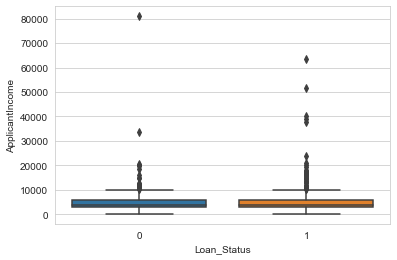

In [29]:
sns.boxplot(x='Loan_Status',y='ApplicantIncome',data=n_tr,showfliers=True)

### Observation

Mean applicants income are nearly equal for both the classes i.e 0 = Loan_Rejected and = Loan_Approved,so applicants income is not a suggestable feature in prediction.

<AxesSubplot:xlabel='Loan_Status', ylabel='CoapplicantIncome'>

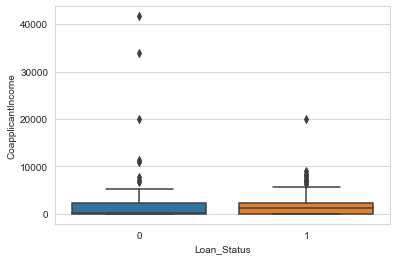

In [30]:
sns.boxplot(x='Loan_Status',y='CoapplicantIncome',data=n_tr)

### Observation

Mean coapplicants income are nearly equal for both the classes i.e 0 = Loan_Rejected and = Loan_Approved,so coapplicants income is not a suggestable feature in prediction.

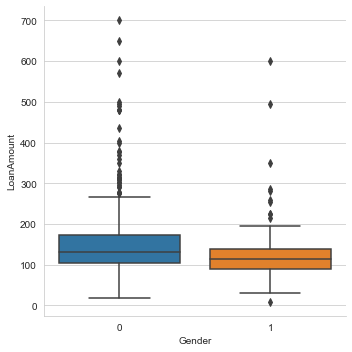

In [31]:
sns.catplot(x='Gender',y='LoanAmount',data=n_tr,kind='box')

### Observation

Loan amount demanded by male applicant (0) is slightly higher than female applicants (1). 

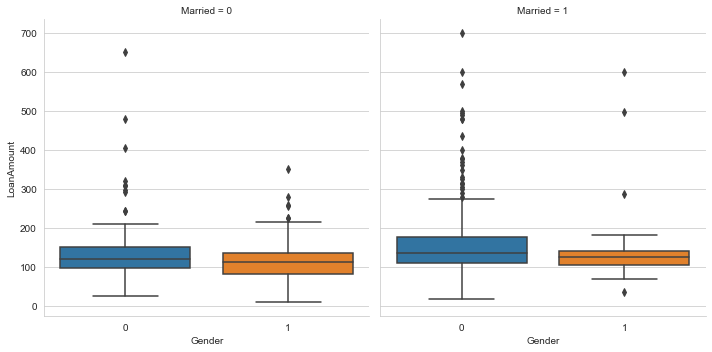

In [32]:
sns.catplot(x='Gender',y='LoanAmount',data=n_tr,kind='box',col='Married')

### Observation

Loan amount proposed by married applicant is higher than unmarried applicants.
Among married again male applicants are higher in number.

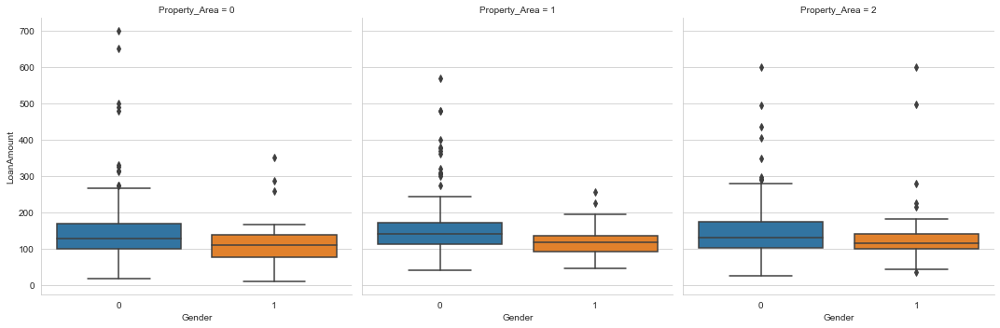

In [33]:
sns.catplot(x='Gender',y='LoanAmount',data=n_tr,kind='box',col='Property_Area')

### Observation

Loan amount proposed is quite indipendent of its locality i.e. urban(0),rural(1) or semi-urban(3), everywhere loan requirments are similer.
Note- Thickness of box for female applicant in plot 1 is thicker than other plots for female applicants which shows inter_qurtile range is higher. 

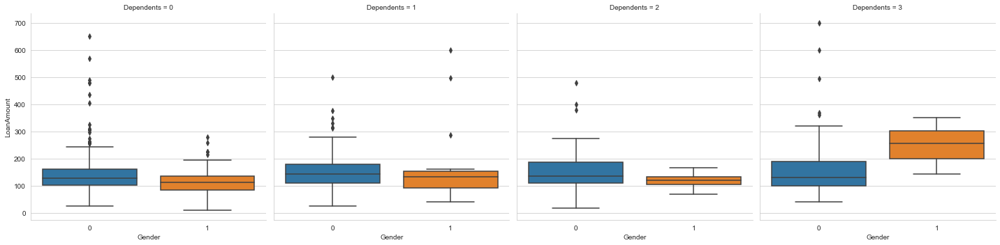

In [34]:
sns.catplot(x='Gender',y='LoanAmount',data=n_tr,kind='box',col='Dependents')

### Observation

Loan amount proposed getting higher as number of dependents increses.
We have large number of female applicants who have 3 or more dependents.

#### Correlation Matrix

<function matplotlib.pyplot.show(close=None, block=None)>

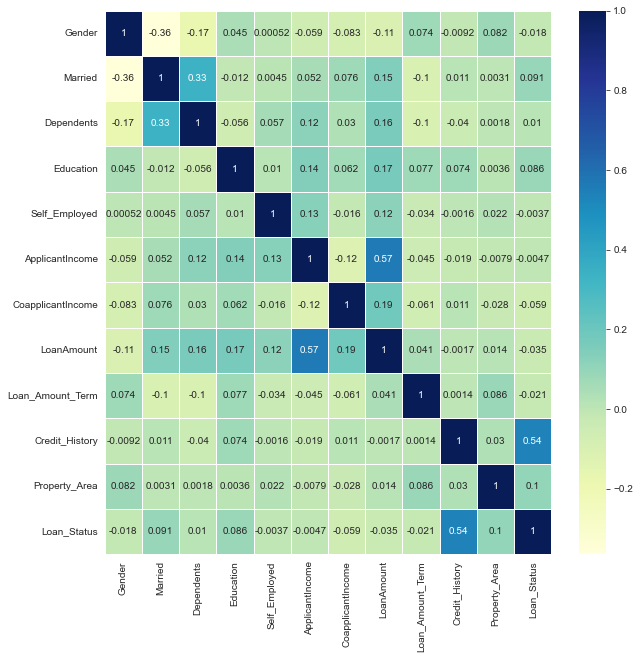

In [35]:
plt.figure(figsize=(10,10))
cor_mat = n_tr.corr()
sns.heatmap(cor_mat,annot=True,cmap='YlGnBu',linewidth=.5)
plt.show

Above figure is 2D-visualisation of correlation of features.It shows interdependency of features, darker the region features are more correlated and vice-versa.

## t-SNE using Scikit-Learn

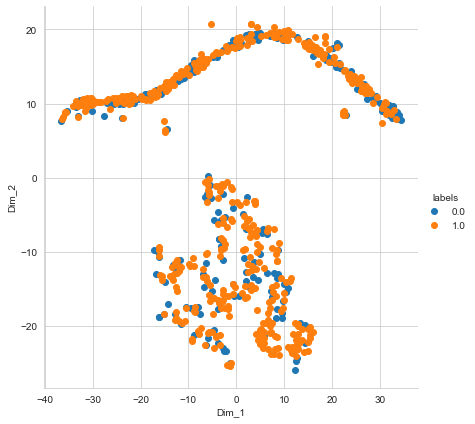

In [36]:
from sklearn.manifold import TSNE
data = n_tr.drop(['Loan_Status'],axis=1)
labels= n_tr['Loan_Status']

model = TSNE(n_components=2, random_state=0)
tsne_data = model.fit_transform(data)

# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels)).T
tsne_df = pd.DataFrame(data=tsne_data,columns=("Dim_1", "Dim_2", "labels"))

# Ploting the result of tsne
sns.FacetGrid(tsne_df, hue="labels", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.show()

In [37]:
m1 = TSNE(n_components=2, random_state=0, perplexity=2,  n_iter=5000)
tsne_data = m1.fit_transform(data) 

# creating a new data fram which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels)).T
df1 = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

In [38]:
m2 = TSNE(n_components=2, random_state=0, perplexity=5,  n_iter=5000)
tsne_data = m2.fit_transform(data) 

# creating a new data fram which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels)).T
df2 = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

In [39]:
m3 = TSNE(n_components=2, random_state=0, perplexity=25,  n_iter=5000)
tsne_data = m3.fit_transform(data) 

# creating a new data fram which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels)).T
df3 = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

In [40]:
m4 = TSNE(n_components=2, random_state=0, perplexity=50,  n_iter=5000)
tsne_data = m4.fit_transform(data) 

# creating a new data fram which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels)).T
df4 = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

In [41]:
m5 = TSNE(n_components=2, random_state=0, perplexity=100,  n_iter=5000)
tsne_data = m5.fit_transform(data) 

# creating a new data fram which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels)).T
df5 = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

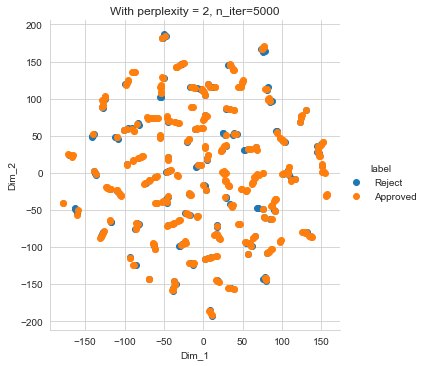

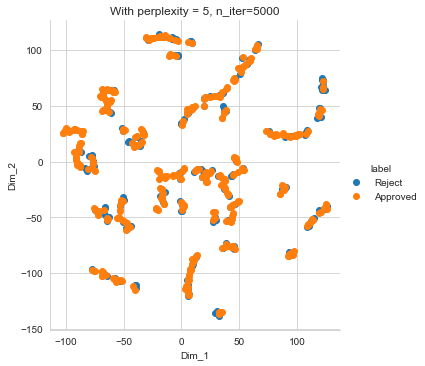

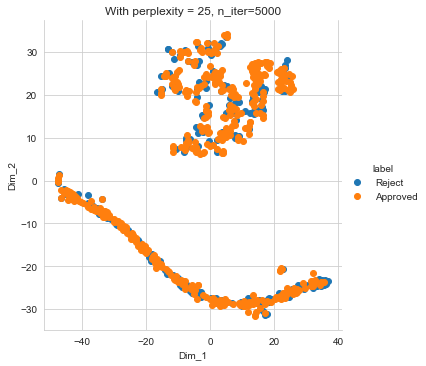

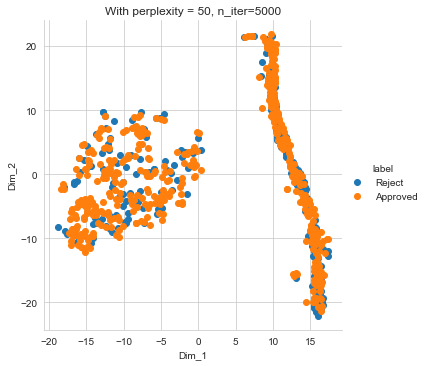

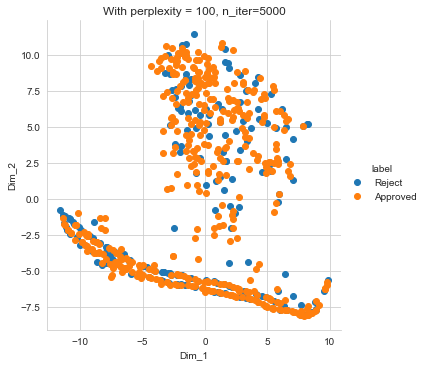

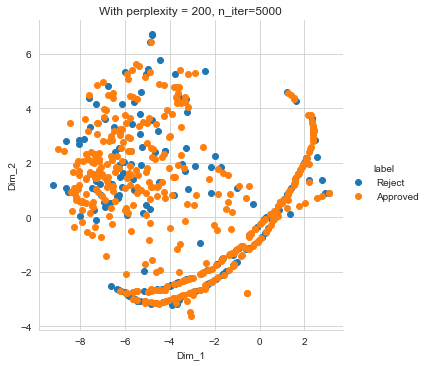

In [42]:
m6 = TSNE(n_components=2, random_state=0, perplexity=200,  n_iter=5000)
tsne_data = m6.fit_transform(data) 

# creating a new data fram which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, labels)).T
df6 = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sns.FacetGrid(df1, hue="label", size=5).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend(labels=['Reject','Approved'])
plt.title('With perplexity = 2, n_iter=5000')
sns.FacetGrid(df2, hue="label", size=5).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend(labels=['Reject','Approved'])
plt.title('With perplexity = 5, n_iter=5000')
sns.FacetGrid(df3, hue="label", size=5).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend(labels=['Reject','Approved'])
plt.title('With perplexity = 25, n_iter=5000')
sns.FacetGrid(df4, hue="label", size=5).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend(labels=['Reject','Approved'])
plt.title('With perplexity = 50, n_iter=5000')
sns.FacetGrid(df5, hue="label", size=5).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend(labels=['Reject','Approved'])
plt.title('With perplexity = 100, n_iter=5000')
sns.FacetGrid(df6, hue="label", size=5).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend(labels=['Reject','Approved'])
plt.title('With perplexity = 200, n_iter=5000')

plt.show()

## Observation

Above plot represents reduction of 13 dimensions to 2 dimensions using t_SNE.
1. Here we can observe that data-points are distributed randomly.
2. Clustering of similer class points are bit difficult in randomly distributed data.
3. Randomness is increasing as perplexity is increasing.
4. Optimal perplexity_value = datasize^(0.5) = 614^(0.5) ~ 25

## Outlier detection

<AxesSubplot:xlabel='ApplicantIncome'>

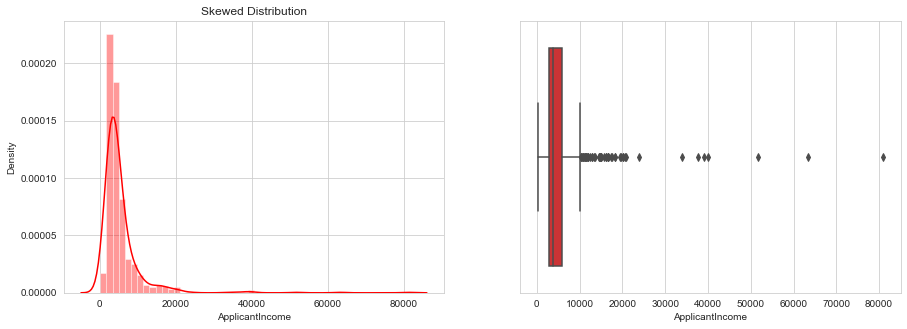

In [43]:
plt.figure(1,figsize=(15,5))
plt.subplot(121)
sns.distplot(n_tr['ApplicantIncome'],color='r')
plt.title('Skewed Distribution')
plt.subplot(122)
sns.boxplot(x=n_tr['ApplicantIncome'],palette='Set1')

### Observation

From the above distribution plot we can observe that Applicant's income is right skewed.
From boxplot we can notice lots of outlier point that needs to be treated. 

<AxesSubplot:xlabel='ApplicantIncome_log'>

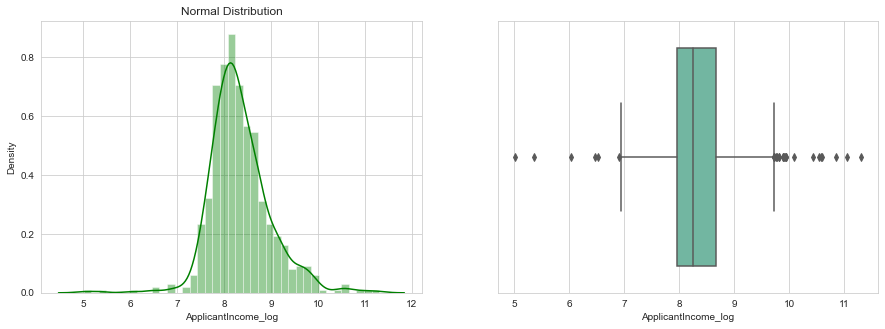

In [44]:
# Removing skewness in ApplicantIncome variable by log transformation
n_tr['ApplicantIncome_log'] = np.log(n_tr['ApplicantIncome'])
n_te['ApplicantIncome_log'] = np.log(test['ApplicantIncome'])

plt.figure(1,figsize=(15,5))
plt.subplot(121)
sns.distplot(n_tr['ApplicantIncome_log'],color='g')
plt.title('Normal Distribution')
plt.subplot(122)
sns.boxplot(x=n_tr['ApplicantIncome_log'],palette='Set2')

<AxesSubplot:xlabel='LoanAmount'>

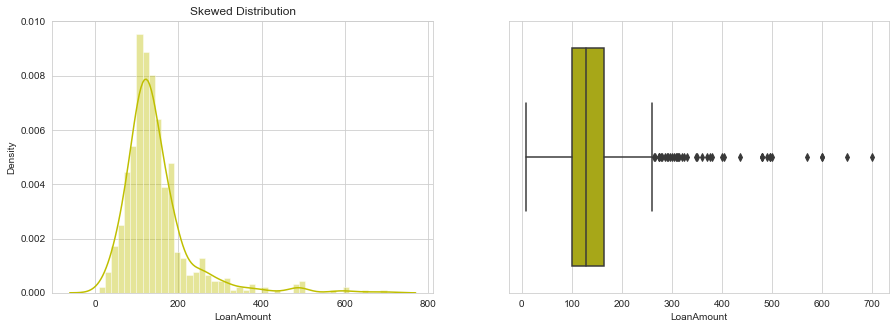

In [45]:
plt.figure(1,figsize=(15,5))
plt.subplot(121)
sns.distplot(n_tr['LoanAmount'],color='y')
plt.title('Skewed Distribution')
plt.subplot(122)
sns.boxplot(x=n_tr['LoanAmount'],color='y')

### Observation

Loan amount distribution is fairly normal but still has a lots of outliers.

<AxesSubplot:xlabel='LoanAmount_log'>

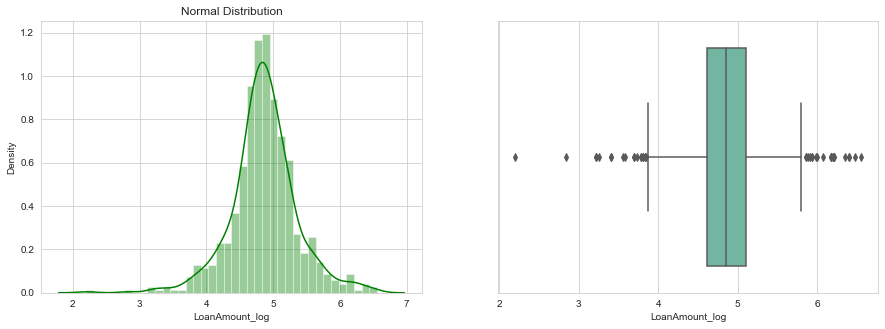

In [46]:
# Removing skewness in LoanAmount variable by log transformation
n_tr['LoanAmount_log'] = np.log(n_tr['LoanAmount'])
n_te['LoanAmount_log'] = np.log(test['LoanAmount'])

plt.figure(1,figsize=(15,5))
plt.subplot(121)
sns.distplot(n_tr['LoanAmount_log'],color='g')
plt.title('Normal Distribution')
plt.subplot(122)
sns.boxplot(x=n_tr['LoanAmount_log'],palette='Set2')

In [47]:
def outlier(feat):
    temp=[]
    a = sorted(feat)
    q1,q3=np.percentile(feat,[25,75])
    iqr_val=q3-q1
    l_bound=q1-(3*iqr_val)
    u_bound=q3+(3*iqr_val)
    for idx,i in enumerate(feat):
        if i<l_bound or i>u_bound:
            temp.append(idx)
    return temp

## Outlier detecion (z-score method)

In [52]:
def z_score_out(ft):
    mean = np.mean(ft)
    std = np.std(ft)
    l_thrs =-3
    u_thrs = 3
    out = []
    outlier = []
    tt = []
    for idx,i in enumerate(ft):
        z = (i-mean)/std
        if z > u_thrs or z<l_thrs:
            out.append(i)
            outlier.append(i)
            tt.append(idx)
        else:
            outlier.append(np.nan)
    a=[]
    for i in ft:
        if i in outlier:
            a.append(np.nan)
        else:
            a.append(i)
    return out,a,outlier,tt

In [53]:
n_tr.shape

(614, 14)

Outlier points : [23803, 39999, 51763, 33846, 39147, 63337, 81000, 37719]
after outlier removal shape =  (606, 14)


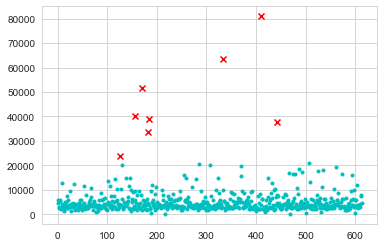

In [54]:
out,a,outlier,tt=z_score_out(n_tr['ApplicantIncome'])
print('Outlier points :',out)
plt.scatter(np.arange(len(a)),a,marker='.',c='c')
plt.scatter(np.arange(len(outlier)),outlier,marker='x',c='r')
    
#remove outliers
df_00 = n_tr.drop(tt)
df_01 = df_00.reset_index(drop=True)
print('after outlier removal shape = ',df_01.shape)

Outlier points : [10968.0, 11300.0, 20000.0, 20000.0, 33837.0, 41667.0]
after outlier removal shape =  (600, 14)


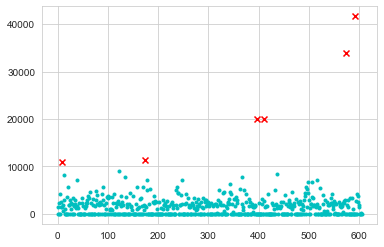

In [55]:
out,a,outlier,tt=z_score_out(df_01['CoapplicantIncome'])
print('Outlier points :',out)
plt.scatter(np.arange(len(a)),a,marker='.',c='c')
plt.scatter(np.arange(len(outlier)),outlier,marker='x',c='r')
    
#remove outliers
df_02 = df_01.drop(tt)
df_03 = df_02.reset_index(drop=True)
print('after outlier removal shape = ',df_03.shape)

Outlier points : [650.0, 436.0, 480.0, 376.0, 570.0, 380.0, 405.0, 500.0, 480.0, 480.0, 400.0, 600.0, 496.0]
after outlier removal shape =  (587, 14)


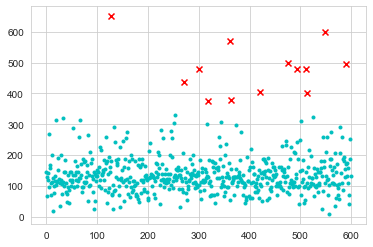

In [56]:
out,a,outlier,tt=z_score_out(df_03['LoanAmount'])
print('Outlier points :',out)
plt.scatter(np.arange(len(a)),a,marker='.',c='c')
plt.scatter(np.arange(len(outlier)),outlier,marker='x',c='r')
    
#remove outliers
df_04 = df_03.drop(tt)
df_05 = df_04.reset_index(drop=True)
print('after outlier removal shape = ',df_05.shape)

Outlier points : [120.0, 60.0, 120.0, 120.0, 60.0, 36.0, 84.0, 84.0, 12.0, 36.0, 84.0, 84.0]
after outlier removal shape =  (575, 14)


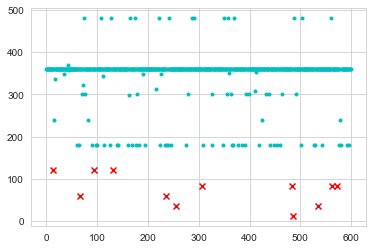

In [57]:
out,a,outlier,tt=z_score_out(df_02['Loan_Amount_Term'])
print('Outlier points :',out)
plt.scatter(np.arange(len(a)),a,marker='.',c='c')
plt.scatter(np.arange(len(outlier)),outlier,marker='x',c='r')
    
#remove outliers
df_06 = df_05.drop(tt)
df_07 = df_06.reset_index(drop=True)
print('after outlier removal shape = ',df_07.shape)

In [58]:
n_tr = df_07
print('Shape of data frame after outlier removal = ',n_tr.shape)

Shape of data frame after outlier removal =  (575, 14)


## Feature Engineering

In [59]:
#Creating new feature - EMI
n_tr['EMI']=(n_tr['LoanAmount']/n_tr['Loan_Amount_Term'])*1000
n_te['EMI']=(n_te['LoanAmount']/n_te['Loan_Amount_Term'])*1000

In [60]:
n_te.shape

(367, 15)

<AxesSubplot:xlabel='EMI'>

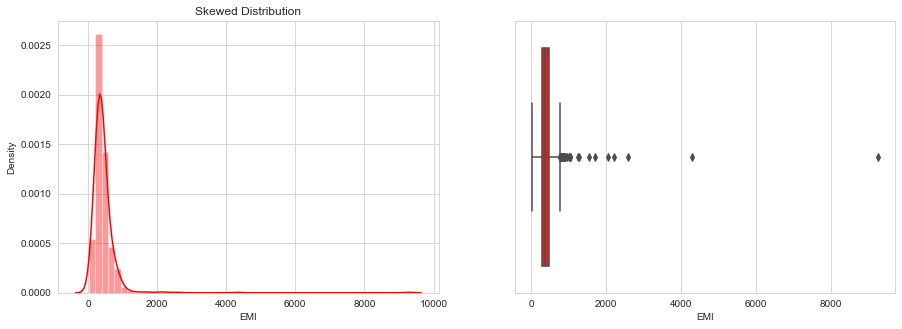

In [61]:
plt.figure(1,figsize=(15,5))
plt.subplot(121)
sns.distplot(n_tr['EMI'],color='r')
plt.title('Skewed Distribution')
plt.subplot(122)
sns.boxplot(x=n_tr['EMI'],color='r')

Above plot is found to be skewed, here we will try to reduce skewness using log function. 

<AxesSubplot:xlabel='EMI_log'>

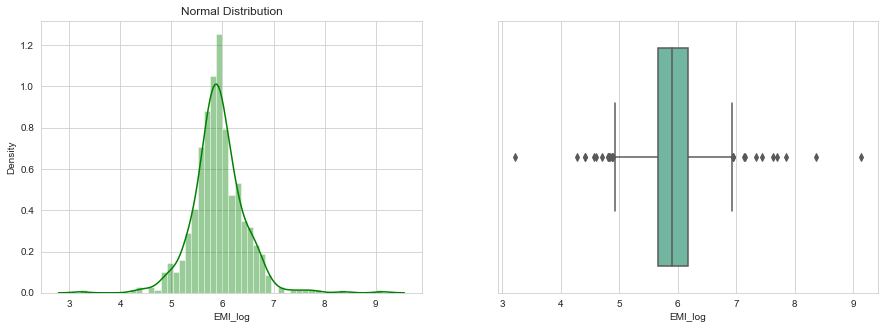

In [62]:
# Removing skewness in EMI variable by log transformation
n_tr['EMI_log'] = np.log(n_tr['EMI'])
n_te['EMI_log'] = np.log(n_te['EMI'])

plt.figure(1,figsize=(15,5))
plt.subplot(121)
sns.distplot(n_tr['EMI_log'],color='g')
plt.title('Normal Distribution')
plt.subplot(122)
sns.boxplot(x=n_tr['EMI_log'],palette='Set2')

In [63]:
# combining Applicant's income and Co-applicant's income
n_tr['Total_Income']=n_tr['ApplicantIncome']+n_tr['CoapplicantIncome']
n_te['Total_Income']=n_te['ApplicantIncome']+n_te['CoapplicantIncome']

<AxesSubplot:xlabel='Total_Income'>

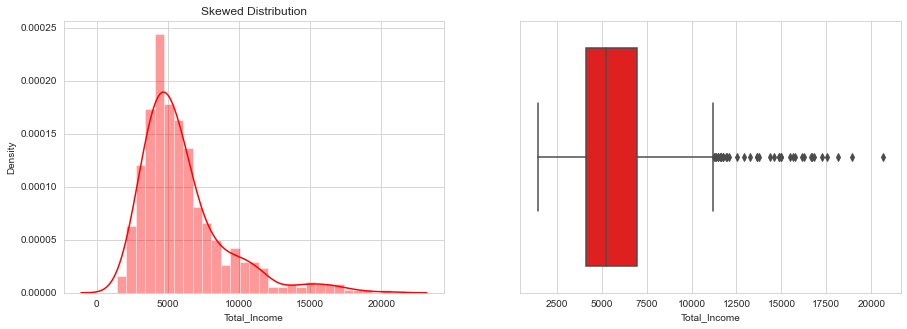

In [64]:
plt.figure(1,figsize=(15,5))
plt.subplot(121)
sns.distplot(n_tr['Total_Income'],color='r')
plt.title('Skewed Distribution')
plt.subplot(122)
sns.boxplot(x=n_tr['Total_Income'],color='r')

<AxesSubplot:xlabel='Total_Income_log'>

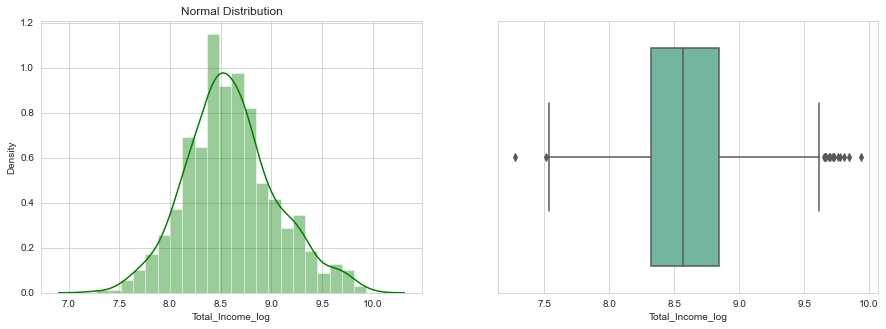

In [65]:
# Removing skewness in Total_Income variable by log transformation
n_tr['Total_Income_log'] = np.log(n_tr['Total_Income'])
n_te['Total_Income_log'] = np.log(n_te['Total_Income'])

plt.figure(1,figsize=(15,5))
plt.subplot(121)
sns.distplot(n_tr['Total_Income_log'],color='g')
plt.title('Normal Distribution')
plt.subplot(122)
sns.boxplot(x=n_tr['Total_Income_log'],palette='Set2')

### Final Data set

In [66]:
#Finally we have new dataset as
train_fin = n_tr
test_fin = n_te.drop('Loan_Status',axis=1)
print('Final train data sahpe : ',train_fin.shape)
print('Final test data sahpe : ',test_fin.shape)

Final train data sahpe :  (575, 18)
Final test data sahpe :  (367, 17)


## Modeling

In [67]:
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import log_loss
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

In [68]:
X = n_tr.drop('Loan_Status',axis=1)
y = train_fin['Loan_Status']

In [69]:
#Splitting train data into train and test for prediction
from sklearn.model_selection import train_test_split

X_tr,X_te,y_tr,y_te = train_test_split(X,y, test_size=0.3, random_state=123)

In [70]:
X_tr.shape,X_te.shape,y_tr.shape,y_te.shape

((402, 17), (173, 17), (402,), (173,))

## 1. Logistic Regression

In [71]:
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    print("Number of misclassified points ",(len(test_y)-np.trace(C))/len(test_y)*100)   
    A =(((C.T)/(C.sum(axis=1))).T)
    B =(C/C.sum(axis=0))
    labels = [1,2]
    cmap=sns.light_palette("green")
    # representing A in heatmap format
    print("-"*50, "Confusion matrix", "-"*50)
    plt.figure(figsize=(10,5))
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

    print("-"*50, "Precision matrix", "-"*50)
    plt.figure(figsize=(10,5))
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    print("Sum of columns in precision matrix",B.sum(axis=0))
    
    # representing B in heatmap format
    print("-"*50, "Recall matrix"    , "-"*50)
    plt.figure(figsize=(10,5))
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()
    print("Sum of rows in precision matrix",A.sum(axis=1))

log_loss for c =  1e-10 is 0.5753079617384864
log_loss for c =  1e-09 is 0.5784308675604587
log_loss for c =  1e-08 is 0.5830013059005859
log_loss for c =  1e-07 is 0.5898222795548161
log_loss for c =  1e-06 is 0.5892174105612028
log_loss for c =  1e-05 is 0.5884499412033225
log_loss for c =  0.0001 is 0.5883274153067527
log_loss for c =  0.001 is 0.5903172719927628
log_loss for c =  0.01 is 0.5795473258100179
log_loss for c =  0.1 is 0.5148965046630457
log_loss for c =  1 is 0.5425291617007243
log_loss for c =  10 is 0.5434888110602927
log_loss for c =  100 is 0.5723658361225634
log_loss for c =  1000 is 0.5069003117581461
log_loss for c =  10000 is 0.5437340518996108
log_loss for c =  100000 is 0.5257701725645083
log_loss for c =  1000000 is 0.5447864960529931


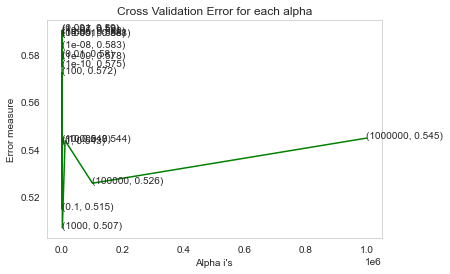

log loss for train data 0.49560110700712434
log loss for cv data 0.5069003117581461
Number of misclassified points  14.450867052023122
-------------------------------------------------- Confusion matrix --------------------------------------------------


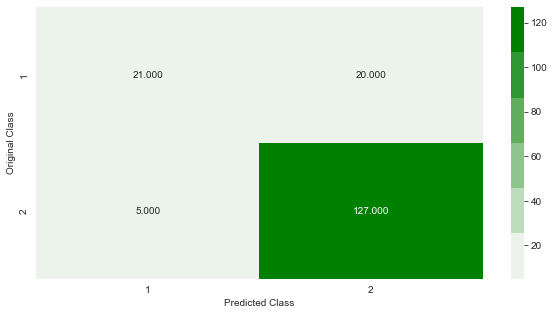

-------------------------------------------------- Precision matrix --------------------------------------------------


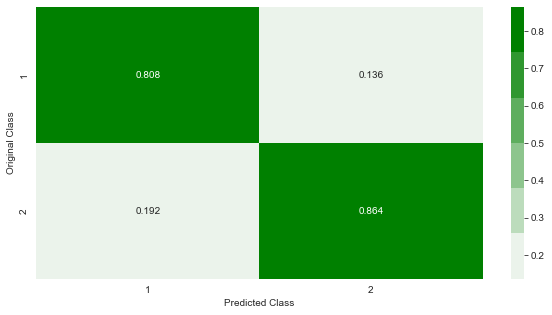

Sum of columns in precision matrix [1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


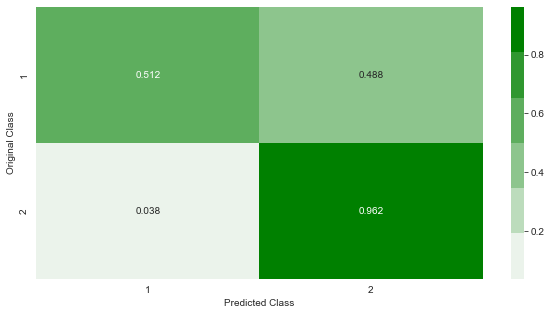

Sum of rows in precision matrix [1. 1.]


In [72]:
alpha = [10 ** x for x in range(-10, 7)]
cv_log_error_array=[]
for i in alpha:
    logisticR=LogisticRegression(penalty='l2',C=i,class_weight='balanced')
    logisticR.fit(X_tr,y_tr)
    sig_clf = CalibratedClassifierCV(logisticR, method="sigmoid")
    sig_clf.fit(X_tr, y_tr)
    predict_y = sig_clf.predict_proba(X_te)
    cv_log_error_array.append(log_loss(y_te, predict_y, labels=logisticR.classes_, eps=1e-15))
    
for i in range(len(cv_log_error_array)):
    print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])

best_alpha = np.argmin(cv_log_error_array)
    
fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

logisticR=LogisticRegression(penalty='l2',C=alpha[best_alpha],class_weight='balanced')
logisticR.fit(X_tr,y_tr)
sig_clf = CalibratedClassifierCV(logisticR, method="sigmoid")
sig_clf.fit(X_tr, y_tr)
pred_y=sig_clf.predict(X_te)

predict_y_tr = sig_clf.predict_proba(X_tr)
print ('log loss for train data',log_loss(y_tr, predict_y_tr, labels=logisticR.classes_, eps=1e-15))
predict_y_te = sig_clf.predict_proba(X_te)
print ('log loss for cv data',log_loss(y_te, predict_y_te, labels=logisticR.classes_, eps=1e-15))
# predict_y = sig_clf.predict_proba(X_te)
# print ('log loss for test data',log_loss(y_te, predict_y, labels=logisticR.classes_, eps=1e-15))
plot_confusion_matrix(y_te, sig_clf.predict(X_te))

train_loss_lr = log_loss(y_tr, predict_y_tr, labels=logisticR.classes_, eps=1e-15)
cv_loss_lr = log_loss(y_te, predict_y_te, labels=logisticR.classes_, eps=1e-15)

In [73]:
prd_tr_lr = sig_clf.predict(X_tr)
prd_te_lr = sig_clf.predict(X_te)
train_acc_lr = accuracy_score(y_tr,prd_tr_lr)
cv_acc_lr = accuracy_score(y_te,prd_te_lr)
train_f1_lr = f1_score(y_tr,prd_tr_lr)
cv_f1_lr = f1_score(y_te,prd_te_lr)

In [112]:
model = sig_clf
model.fit(X_tr, y_tr)

test_1 = X_te.iloc[1]

In [113]:
import lime 
from lime import lime_tabular

lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_tr),
    feature_names=X_tr.columns,
    class_names=['Rejected','Approved'],
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=test_1,
    predict_fn=model.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [74]:
from tabulate import tabulate
data = [[train_loss_lr,cv_loss_lr,train_acc_lr,cv_acc_lr,cv_f1_lr]]
head = ['Train_log_loss','CV_log_loss','tr_accuracy','te_accuracy','F1_score']
print('Results of Logistic Regression :-')
print(tabulate(data,head,tablefmt='grid'))

Results of Logistic Regression :-
+------------------+---------------+---------------+---------------+------------+
|   Train_log_loss |   CV_log_loss |   tr_accuracy |   te_accuracy |   F1_score |
+==================+===============+===============+===============+============+
|         0.495601 |        0.5069 |       0.79602 |      0.855491 |   0.910394 |
+------------------+---------------+---------------+---------------+------------+


In [75]:
import pickle
pickle.dump(logisticR, open('file_for_deployment.pkl', 'wb'))

## XGBoost

log_loss for c =  1 is 0.4437617555552006
log_loss for c =  10 is 0.4259975423960293
log_loss for c =  50 is 0.45262365094256085
log_loss for c =  100 is 0.4592742994458606
log_loss for c =  200 is 0.4651298331038887
log_loss for c =  400 is 0.4733108088015711
log_loss for c =  500 is 0.4750871168494384


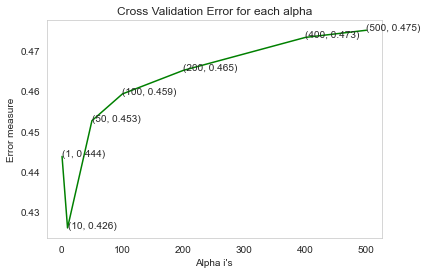

For values of best alpha =  10 The train log loss is: 0.3541224697406622
For values of best alpha =  10 The cross validation log loss is: 0.4259975423960293
For values of best alpha =  10 The test log loss is: 0.4259975423960293
Number of misclassified points  14.450867052023122
-------------------------------------------------- Confusion matrix --------------------------------------------------


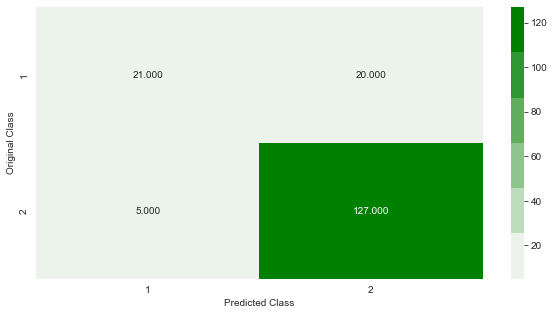

-------------------------------------------------- Precision matrix --------------------------------------------------


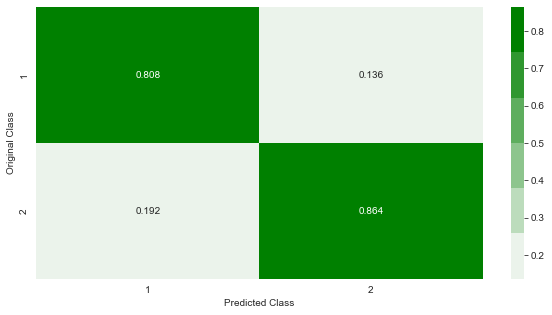

Sum of columns in precision matrix [1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


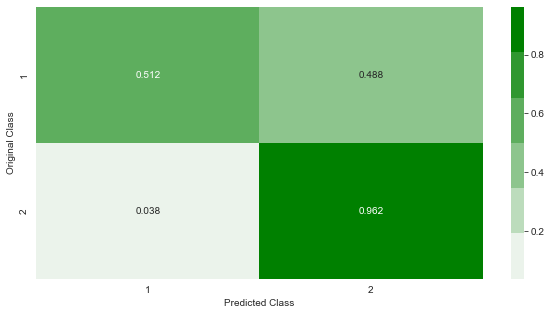

Sum of rows in precision matrix [1. 1.]


In [76]:
alpha=[1,10,50,100,200,400,500]
cv_log_error_array=[]
for i in alpha:
    x_cfl=XGBClassifier(n_estimators=i,nthread=-1)
    x_cfl.fit(X_tr,y_tr)
    sig_clf = CalibratedClassifierCV(x_cfl, method="sigmoid")
    sig_clf.fit(X_tr, y_tr)
    predict_y = sig_clf.predict_proba(X_te)
    cv_log_error_array.append(log_loss(y_te, predict_y, labels=x_cfl.classes_, eps=1e-15))

for i in range(len(cv_log_error_array)):
    print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])

best_alpha = np.argmin(cv_log_error_array)

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

x_cfl=XGBClassifier(n_estimators=alpha[best_alpha],nthread=-1)
x_cfl.fit(X_tr,y_tr)
sig_clf = CalibratedClassifierCV(x_cfl, method="sigmoid")
sig_clf.fit(X_tr, y_tr)
    
predict_y = sig_clf.predict_proba(X_tr)
print ('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_tr, predict_y))
predict_y = sig_clf.predict_proba(X_te)
print('For values of best alpha = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_te, predict_y))
predict_y = sig_clf.predict_proba(X_te)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_te, predict_y))
plot_confusion_matrix(y_te, sig_clf.predict(X_te))

In [77]:
# https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/
from sklearn.model_selection import RandomizedSearchCV
x_cfl=XGBClassifier()

prams={
    'learning_rate':[0.01,0.03,0.05,0.1,0.15,0.2],
     'n_estimators':[100,200,500,1000,2000],
     'max_depth':[3,5,10],
    'colsample_bytree':[0.1,0.3,0.5,1],
    'subsample':[0.1,0.3,0.5,1]
}
random_cfl1=RandomizedSearchCV(x_cfl,param_distributions=prams,verbose=10,n_jobs=-1,)
random_cfl1.fit(X_tr,y_tr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, gamma=None,
                                           gpu_id=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None, max_bin=None,
                                           max_c...
                                           monotone_constraints=None,
                                           n

In [78]:
print (random_cfl1.best_params_)

{'subsample': 0.3, 'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.01, 'colsample_bytree': 1}


In [79]:
random_cfl1.best_params_.get('n_estimators')

200

In [80]:
x_cfl=XGBClassifier(n_estimators=random_cfl1.best_params_.get('n_estimators'),
                    learning_rate=random_cfl1.best_params_.get('learning_rate'),
                    colsample_bytree=random_cfl1.best_params_.get('colsample_bytree'),
                    max_depth=random_cfl1.best_params_.get('max_depth'))
x_cfl.fit(X_tr,y_tr)
c_cfl=CalibratedClassifierCV(x_cfl,method='sigmoid')
c_cfl.fit(X_tr,y_tr)

predict_y = c_cfl.predict_proba(X_tr)
train_loss_xgb = log_loss(y_tr, predict_y)

predict_y = c_cfl.predict_proba(X_te)
cv_loss_xgb = log_loss(y_te, predict_y)

prd_tr = c_cfl.predict(X_tr)
prd_te = c_cfl.predict(X_te)
train_accuracy_xgb = accuracy_score(y_tr,prd_tr)
test_accuracy_xgb = accuracy_score(y_te,prd_te)

cv_f1_score_xgb = f1_score(y_te, prd_te)

In [103]:
model = sig_clf_rf
model.fit(X_tr, y_tr)

test_1 = X_te.iloc[1]

In [104]:
import lime 
from lime import lime_tabular

lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_tr),
    feature_names=X_tr.columns,
    class_names=['Rejected','Approved'],
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=test_1,
    predict_fn=model.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [81]:
from tabulate import tabulate
data = [[train_loss_xgb,cv_loss_xgb,train_accuracy_xgb,test_accuracy_xgb,cv_f1_score_xgb]]
head = ['Train_log_loss','CV_log_loss','tr_accuracy','te_accuracy','F1_score']
print('Results of XGBoost Classfier :-')
print(tabulate(data,head,tablefmt='grid'))

Results of XGBoost Classfier :-
+------------------+---------------+---------------+---------------+------------+
|   Train_log_loss |   CV_log_loss |   tr_accuracy |   te_accuracy |   F1_score |
+==================+===============+===============+===============+============+
|         0.434071 |      0.412471 |      0.798507 |      0.872832 |   0.921986 |
+------------------+---------------+---------------+---------------+------------+


In [110]:
model = c_cfl
model.fit(X_tr, y_tr)

test_1 = X_te.iloc[1]

In [111]:
import lime 
from lime import lime_tabular

lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_tr),
    feature_names=X_tr.columns,
    class_names=['Rejected','Approved'],
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=test_1,
    predict_fn=model.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [91]:
import pickle
pickle.dump(c_cfl, open('file_for_deployment_xgb.pkl', 'wb'))

## Decision Tree

log_loss for c =  0.5 is 0.5744170127918266
log_loss for c =  0.1 is 0.5744170127918266
log_loss for c =  1 is 0.4173134636312212
log_loss for c =  2 is 0.4254403680886572
log_loss for c =  3 is 0.43009477026806453
log_loss for c =  4 is 0.43812592126643524
log_loss for c =  5 is 0.44056947214913145


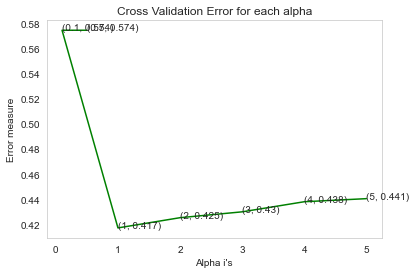

log loss for train data 0.4993307334561149
log loss for cv data 0.4173134636312212
Number of misclassified points  13.294797687861271
-------------------------------------------------- Confusion matrix --------------------------------------------------


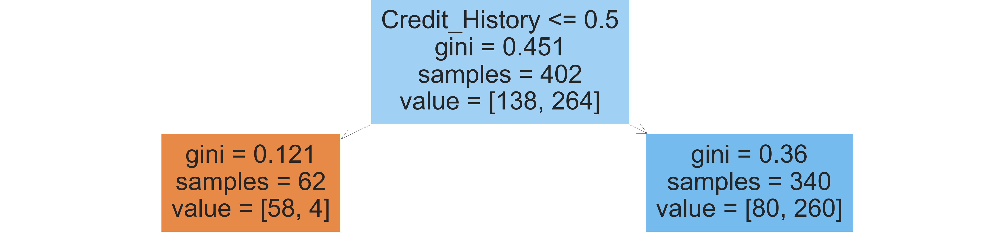

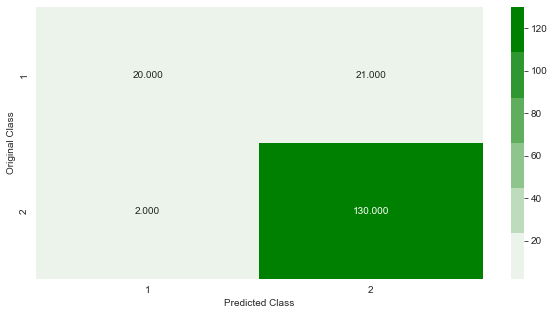

-------------------------------------------------- Precision matrix --------------------------------------------------


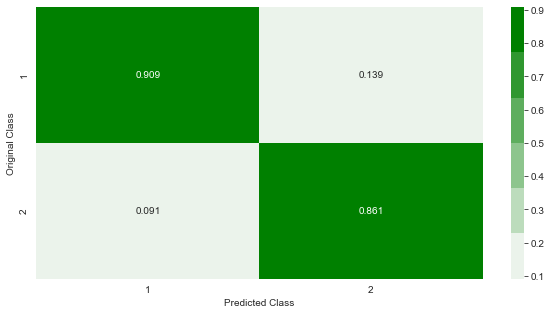

Sum of columns in precision matrix [1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


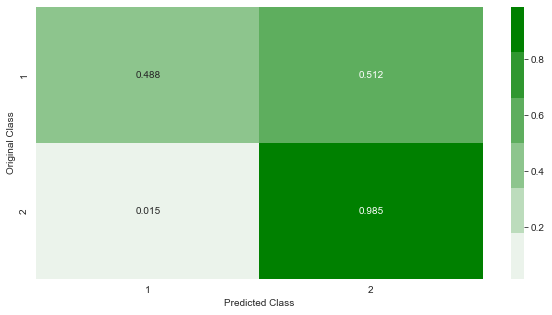

Sum of rows in precision matrix [1. 1.]


In [82]:
alpha=[0.5,0.1,1,2,3,4,5]
cv_log_error_array=[]
for i in alpha:
    r_cfl=tree.DecisionTreeClassifier(max_depth=i,random_state=45)
    r_cfl.fit(X_tr,y_tr)
    sig_clf_dt = CalibratedClassifierCV(r_cfl, method="sigmoid")
    sig_clf_dt.fit(X_tr, y_tr)
    predict_y = sig_clf_dt.predict_proba(X_te)
    cv_log_error_array.append(log_loss(y_te, predict_y, labels=r_cfl.classes_, eps=1e-15))

for i in range(len(cv_log_error_array)):
    print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])


best_alpha = np.argmin(cv_log_error_array)

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

r_cfl=tree.DecisionTreeClassifier(max_depth=1,random_state=42)
r_cfl.fit(X_tr,y_tr)
plt.figure(figsize=(80,20))
tree.plot_tree(r_cfl,feature_names=X_tr.columns,max_depth=2,filled=True)
sig_clf_dt = CalibratedClassifierCV(r_cfl, method="sigmoid")
sig_clf_dt.fit(X_tr, y_tr)
predict_y = sig_clf_dt.predict_proba(X_tr)
train_loss_dt = log_loss(y_tr, predict_y, labels=sig_clf_dt.classes_, eps=1e-15)
print ('log loss for train data',train_loss_dt)
predict_y = sig_clf_dt.predict_proba(X_te)
test_loss_dt = log_loss(y_te, predict_y, labels=sig_clf_dt.classes_, eps=1e-15)
print ('log loss for cv data',test_loss_dt)
# predict_y = sig_clf_dt.predict_proba(X_te)
# print ('log loss for test data',(log_loss(y_te, predict_y, labels=sig_clf_dt.classes_, eps=1e-15)))
plot_confusion_matrix(y_te,sig_clf_dt.predict(X_te))

In [83]:
prd_tr_dt = sig_clf_dt.predict(X_tr)
prd_te_dt = sig_clf_dt.predict(X_te)
train_acc_dt = accuracy_score(y_tr,prd_tr_dt)
cv_acc_dt = accuracy_score(y_te,prd_te_dt)
train_f1_dt = f1_score(y_tr,prd_tr_dt)
cv_f1_dt = f1_score(y_te,prd_te_dt)

In [127]:
model = sig_clf_dt
model.fit(X_tr, y_tr)

test_1 = X_te.iloc[1]

In [128]:
import lime 
from lime import lime_tabular

lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_tr),
    feature_names=X_tr.columns,
    class_names=['Rejected','Approved'],
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=test_1,
    predict_fn=model.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [84]:
from tabulate import tabulate
data = [[train_loss_dt,test_loss_dt,train_acc_dt,cv_acc_dt,cv_f1_dt]]
head = ['Train_log_loss','CV_log_loss','tr_accuracy','te_accuracy','F1_score']
print('Results of Logistic Regression :-')
print(tabulate(data,head,tablefmt='grid'))

Results of Logistic Regression :-
+------------------+---------------+---------------+---------------+------------+
|   Train_log_loss |   CV_log_loss |   tr_accuracy |   te_accuracy |   F1_score |
+==================+===============+===============+===============+============+
|         0.499331 |      0.417313 |      0.791045 |      0.867052 |   0.918728 |
+------------------+---------------+---------------+---------------+------------+


## Random Forest

log_loss for c =  10 is 0.4406698547104639
log_loss for c =  50 is 0.4257943540684606
log_loss for c =  100 is 0.42873058395363844
log_loss for c =  500 is 0.4283520817786852
log_loss for c =  1000 is 0.42711117145449656
log_loss for c =  2000 is 0.4277655374766167
log_loss for c =  3000 is 0.4275213926434798


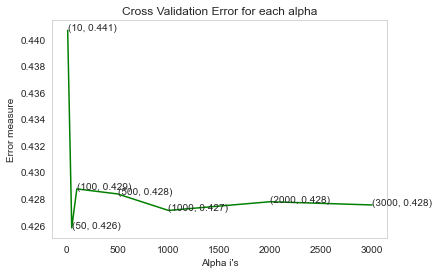

log loss for train data 0.25935964907915804
log loss for cv data 0.4257943540684606
Number of misclassified points  13.294797687861271
-------------------------------------------------- Confusion matrix --------------------------------------------------


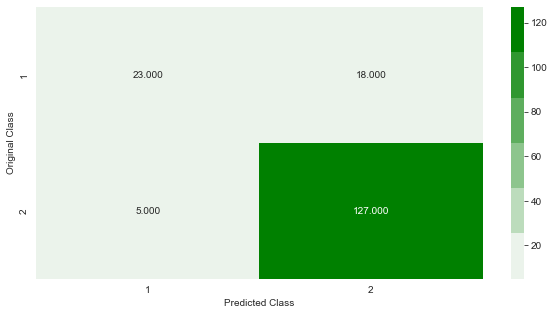

-------------------------------------------------- Precision matrix --------------------------------------------------


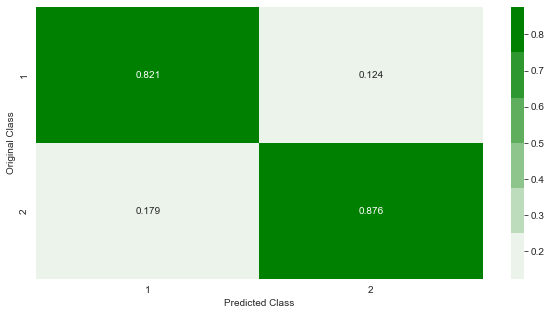

Sum of columns in precision matrix [1. 1.]
-------------------------------------------------- Recall matrix --------------------------------------------------


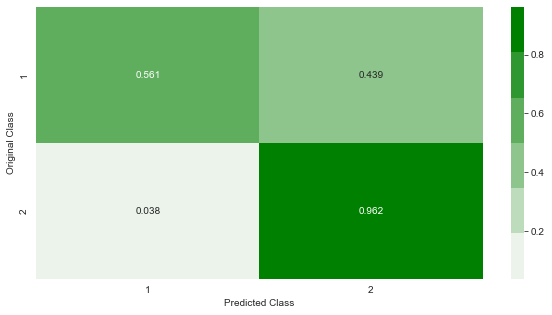

Sum of rows in precision matrix [1. 1.]


In [85]:
alpha=[10,50,100,500,1000,2000,3000]
cv_log_error_array=[]
for i in alpha:
    r_cfl=RandomForestClassifier(n_estimators=i,random_state=42,n_jobs=-1)
    r_cfl.fit(X_tr,y_tr)
    sig_clf_rf = CalibratedClassifierCV(r_cfl, method="sigmoid")
    sig_clf_rf.fit(X_tr, y_tr)
    predict_y = sig_clf_rf.predict_proba(X_te)
    cv_log_error_array.append(log_loss(y_te, predict_y, labels=r_cfl.classes_, eps=1e-15))

for i in range(len(cv_log_error_array)):
    print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])


best_alpha = np.argmin(cv_log_error_array)

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

r_cfl=RandomForestClassifier(n_estimators=alpha[best_alpha],random_state=42,n_jobs=-1)
r_cfl.fit(X_tr,y_tr)
sig_clf_rf = CalibratedClassifierCV(r_cfl, method="sigmoid")
sig_clf_rf.fit(X_tr, y_tr)
predict_y = sig_clf_rf.predict_proba(X_tr)
train_loss_rf = log_loss(y_tr, predict_y, labels=sig_clf_rf.classes_, eps=1e-15)
print ('log loss for train data',train_loss_rf)
predict_y = sig_clf_rf.predict_proba(X_te)
test_loss_rf = log_loss(y_te, predict_y, labels=sig_clf_rf.classes_, eps=1e-15)
print ('log loss for cv data',test_loss_rf)
# predict_y = sig_clf_rf.predict_proba(X_te)
# print ('log loss for test data',(log_loss(y_te, predict_y, labels=sig_clf_rf.classes_, eps=1e-15)))
plot_confusion_matrix(y_te,sig_clf_rf.predict(X_te))

In [86]:
prd_tr_rf = sig_clf_rf.predict(X_tr)
prd_te_rf = sig_clf_rf.predict(X_te)
train_acc_rf = accuracy_score(y_tr,prd_tr_rf)
cv_acc_rf = accuracy_score(y_te,prd_te_rf)
train_f1_rf = f1_score(y_tr,prd_tr_rf)
cv_f1_rf = f1_score(y_te,prd_te_rf)

In [87]:
from tabulate import tabulate
data = [[train_loss_rf,test_loss_rf,train_acc_rf,cv_acc_rf,cv_f1_rf]]
head = ['Train_log_loss','CV_log_loss','tr_accuracy','te_accuracy','F1_score']
print('Results of Random Forest :-')
print(tabulate(data,head,tablefmt='grid'))

Results of Random Forest :-
+------------------+---------------+---------------+---------------+------------+
|   Train_log_loss |   CV_log_loss |   tr_accuracy |   te_accuracy |   F1_score |
+==================+===============+===============+===============+============+
|          0.25936 |      0.425794 |       0.99005 |      0.867052 |   0.916968 |
+------------------+---------------+---------------+---------------+------------+


In [106]:
model = sig_clf_rf
model.fit(X_tr, y_tr)

test_1 = X_te.iloc[1]

In [107]:
import lime 
from lime import lime_tabular

lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_tr),
    feature_names=X_tr.columns,
    class_names=['Rejected','Approved'],
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=test_1,
    predict_fn=model.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [88]:
import pickle
pickle.dump(sig_clf, open('file_for_deployment_rf.pkl', 'wb'))

# CONCLUSION

In [98]:
from tabulate import tabulate
data = [['Logistic Regression',train_loss_lr,cv_loss_lr,train_acc_lr,cv_acc_lr,cv_f1_lr],
       ['XGBoost',train_loss_xgb,cv_loss_xgb,train_accuracy_xgb,test_accuracy_xgb,cv_f1_score_xgb],
       ['Decision Tree',train_loss_dt,test_loss_dt,train_acc_dt,cv_acc_dt,cv_f1_dt],
       ['Random Forest',train_loss_rf,test_loss_rf,train_acc_rf,cv_acc_rf,cv_f1_rf]]
head = ['Model','Train loss','cv loss','train accuracy','cv accuracy','F1_Score']
print('*'*98)
print()
print('                           -: Conclusion of all the models :-\n')
print(tabulate(data,head,tablefmt='grid'))

**************************************************************************************************

                           -: Conclusion of all the models :-

+---------------------+--------------+-----------+------------------+---------------+------------+
| Model               |   Train loss |   cv loss |   train accuracy |   cv accuracy |   F1_Score |
+=====================+==============+===========+==================+===============+============+
| Logistic Regression |     0.495601 |  0.5069   |         0.79602  |      0.855491 |   0.910394 |
+---------------------+--------------+-----------+------------------+---------------+------------+
| XGBoost             |     0.434071 |  0.412471 |         0.798507 |      0.872832 |   0.921986 |
+---------------------+--------------+-----------+------------------+---------------+------------+
| Decision Tree       |     0.499331 |  0.417313 |         0.791045 |      0.867052 |   0.918728 |
+---------------------+--------------+-------

## Observation

For the classification task we have used four models and found that all the models are perform nearly similer but here we have best model- 'XGBoost classifier' with accuracy score of 87.28% and F1_score of ~ 92.20%.